# Importing Data & Packages

In [1]:
# General purpose libraries
import random
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import datetime

# Deep learning library
import keras 
from keras import layers

print('Everything Imported Succesfully!')

Everything Imported Succesfully!


## importing tha data from a csv file
import with date parsed and indexes set. fix the name of the data time column and fill NaN in batch names with 'no batch specified'

In [2]:
data=pd.read_csv('/kaggle/input/301-330-days/Data_5IAL_3_301.csv',index_col=0,parse_dates=[1])  # Read data
data.rename(columns={'0':'Date'},inplace=True)                                                  # Give date column a descriptive name
data['5IAL_3_301.BatchName']=data['5IAL_3_301.BatchName'].fillna('No Batch Specified')          # Replace batchnames NaN's with 'no batch'
data.head()

/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3553: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,Date,5IAL_3_TT301.50,5IAL_3_QIT301.52,5IAL_3_PIT 301.55,5IAL_3_QIT301.57,5IAL_3_PIT301.60,5IAL_3_FIT301.61MF,5IAL_3_FIT301.61VF,5IAL_3_FIT301.61D,5IAL_3_PIT301.63,...,5IAL_3_GSC301.44,5IAL_3_GSO301.44,5IAL_3_LSL301.64,5IAL_3_LSL301.68,5IAL_3_LSLL301.69,5IAL_3_301.OCCUPIED,5IAL_3_LIT301.54,5IAL_3_LSH301.56,5IAL_3_XPV301.13,5IAL_3_WY301.54
0,2022-04-10 12:00:00,21.80,9.84,-0.02,0.0,0.0,0.0,0.0,0.00105,2.07,...,0,0,0,0,0,0,1.40,0,0.0,0.0
1,2022-04-10 12:01:00,21.80,9.84,-0.02,0.0,0.0,0.0,0.0,0.00106,2.07,...,0,0,0,0,0,0,1.40,0,0.0,0.0
2,2022-04-10 12:02:00,21.80,9.84,-0.02,0.0,0.0,0.0,0.0,0.00102,2.07,...,0,0,0,0,0,0,1.41,0,0.0,0.0
3,2022-04-10 12:03:00,21.78,9.84,-0.02,0.0,0.0,0.0,0.0,0.00105,2.07,...,0,0,0,0,0,0,1.40,0,0.0,0.0
4,2022-04-10 12:04:00,21.78,9.84,-0.02,0.0,0.0,0.0,0.0,0.00104,2.07,...,0,0,0,0,0,0,1.40,0,0.0,0.0


### Batchcode date checker

In [3]:
pd_data=(data['5IAL_3_301.BatchName']=='IU7012228605')

#print(np.sum(pd_data))
#print(pd_data[pd_data].index[0])

print(data['Date'][pd_data[pd_data].index[0]])

2022-10-13 14:47:00


In [4]:
batch_IU=data.loc[data['5IAL_3_301.BatchName'].str.contains("KC", case=False)]
print(batch_IU['5IAL_3_301.BatchName'].unique())

for i in range(12):
    print(batch_IU['5IAL_3_301.BatchName'].unique()[i])
    print(len(batch_IU['5IAL_3_301.BatchName'].unique()[i]))

['KC112211501' 'KC112211502' 'Na KC112211502' 'KC112213601' 'KC112213701'
 'na KC112213701' 'KC112215401' 'KC112215402' 'NA KC112215402'
 'NA KC112215402 DEMI' 'KC112217901' 'KC112217902' 'Na KC112217902'
 'kC112219301' 'KC112219302' 'NA KC112219302' 'KC112220901' 'KC112220902'
 'KC112220903' 'na KC112220903' 'KC112222901' 'KC112222902' 'Kc112222903'
 'NA Kc112222903' 'KC112227001' 'KC112227002' 'KC112227102'
 'Na KC112227102' 'KC12228601' 'KC112228602' 'N a KC112228602'
 'KC112230001' 'KC112230002' 'KC112230003' 'KC112230004' 'NA KC112230004'
 'KC112306501']
KC112211501
11
KC112211502
11
Na KC112211502
14
KC112213601
11
KC112213701
11
na KC112213701
14
KC112215401
11
KC112215402
11
NA KC112215402
14
NA KC112215402 DEMI
19
KC112217901
11
KC112217902
11


# Data Splitting and Grouping 

In [5]:
#give unique batch names
Batch_Names=data['5IAL_3_301.BatchName']
unique_names=Batch_Names.unique()
print(unique_names)

['No Batch Specified' 'YP5812210101' 'YP5812210102' ... 'KB212306501'
 'NA KB212306501' 'KC112306501']


In [6]:
print(unique_names.size)

1629


## Filter out the batches
In this step everything that is not a viable batch is filterd out.\
This way demi cleanings, CIP cleanings and downtime are no longer in the dataset.

In [7]:
#Convert the unique_names numpy array to a pandas series
temp_df=pd.Series(unique_names)


submask_IU=temp_df.str.contains("CGD", case=False) | temp_df.str.contains("IU", case=False)

submask_length=((temp_df.str.len() >= 11) & (temp_df.str.len() <= 12))

# Create a boolean mask to select rows where the length of the specified column is between 11 and 12 characters (inclusive)
mask = submask_length  #~submask_IU & submask_length


# Use the boolean mask to select only the rows that meet the criteria
Viable_Batches = unique_names[mask]

print(Viable_Batches.size)

del temp_df

1205


## Seperate out unique ink types

In [8]:
batch_types_list=[]

for i in range(len(Viable_Batches)):
    if len(Viable_Batches[i]) == 11:
        substring=Viable_Batches[i][0:3]
    else:
        substring=Viable_Batches[i][0:4]
    batch_types_list.append(substring.upper())

series=pd.Series(batch_types_list)
series= series.replace({'IU7':'IU70'})
series.name='Category'
print(series)
series_unieque=series.unique()
print(series_unieque)

0       YP58
1       YP58
2        CD1
3        CD1
4        CD1
        ... 
1200     CB2
1201     KB2
1202     KB2
1203     KB2
1204     KC1
Name: Category, Length: 1205, dtype: object
['YP58' 'CD1' 'KD1' 'MD1' 'YD1' 'YP70' 'KP70' 'CP70' 'MP70' 'YB2' 'CB2'
 'KC1' 'KB2' 'MB2' 'MP55' 'CP55' 'KP55' 'YP55' 'KP58' 'CP58' 'MP58' 'YC1'
 'CC1' 'MC1' 'IU70' 'CGB2' 'CGD1']


In [9]:
ink_type=pd.concat([pd.DataFrame(Viable_Batches),series],axis=1)
ink_type.rename(columns={0: "Batchnames"},inplace=True)
print(ink_type)

One_hot=pd.get_dummies(series)
print(One_hot)

        Batchnames Category
0     YP5812210101     YP58
1     YP5812210102     YP58
2      CD112210101      CD1
3      CD112210102      CD1
4      CD112210103      CD1
...            ...      ...
1200   CB212306201      CB2
1201   KB212306201      KB2
1202   KB212306202      KB2
1203   KB212306501      KB2
1204   KC112306501      KC1

[1205 rows x 2 columns]
      CB2  CC1  CD1  CGB2  CGD1  CP55  CP58  CP70  IU70  KB2  ...  MD1  MP55  \
0       0    0    0     0     0     0     0     0     0    0  ...    0     0   
1       0    0    0     0     0     0     0     0     0    0  ...    0     0   
2       0    0    1     0     0     0     0     0     0    0  ...    0     0   
3       0    0    1     0     0     0     0     0     0    0  ...    0     0   
4       0    0    1     0     0     0     0     0     0    0  ...    0     0   
...   ...  ...  ...   ...   ...   ...   ...   ...   ...  ...  ...  ...   ...   
1200    1    0    0     0     0     0     0     0     0    0  ...    0     0   

In [10]:
for row in series_unieque:
    data[row]=0


for i in range(len(Viable_Batches)):
    Batch_Name=Viable_Batches[i]
    
    # grab all batch data and look at the index of the first instance of a name and the last instance.
    pd_data=(data['5IAL_3_301.BatchName']==Batch_Name)
    batch_begin_index=(pd_data[pd_data].index[0])
    batch_end_index=(pd_data[pd_data].index[-1])
    
    # grab the category for this particular batch
    Category=(ink_type['Category'][i])
    
    data.loc[batch_begin_index:batch_end_index, Category] = 1
    
data.head()
data=data.drop(['CGB2'],axis=1)

## Train Test Split

Randomly pick the Test_Train_split fraction of data from the filterd unique name list.\
This way a percentage of batches are not used in training and thus can be used for testing.

In [11]:
To_split=Viable_Batches
Test_Train_split=0.2

Test_Batches=random.sample(To_split.tolist(), round(To_split.size*Test_Train_split))

Train_Batches = [x for x in To_split if x not in Test_Batches]

print(len(Test_Batches))
print(len(Train_Batches))

# Use 'isin' to only select datapoint that have a batch name that was selected by the Test_Train split
Train_Data=data[data['5IAL_3_301.BatchName'].isin(Train_Batches)]
Test_Data=data[data['5IAL_3_301.BatchName'].isin(Test_Batches)]

241
964


## Normalise the selection with use of the Z-Score
The Z-score can be described as:\
$Z=\frac{x-\mu}{\sigma}$

In this x is your value, μ is the average of the population that value is taken from, and σ is the standard deviation of the population. It is basicaly a measure of how far a given value is away from its mean in standard deviations. To give you a good feeling, in a normal distribution 66% of values are within 1 std of the mean. 99% are withing 2 std and 99.9 is within 3

Note that the data does not represent a normal curve or bell curve at all. This is solely done to make sure the Neural network gives every value an equeal weigth.\

Also drop everything that turns into NaN's when normalizing

In [12]:
names=Train_Data['5IAL_3_301.BatchName']

col_2_drop=['Date','5IAL_3_301.BatchName','5IAL_3_LSH301.56','5IAL_3_XPV301.05','5IAL_3_XPV301.06','5IAL_3_XPV301.08','5IAL_3_XPV301.09','5IAL_3_XPV301.22','5IAL_3_XPV301.36','5IAL_3_XPV301.42','5IAL_3_XPV301.43','5IAL_3_XPV301.46','5IAL_3_LSL301.64','5IAL_3_XPV301.35']
df=Train_Data.drop(col_2_drop,axis=1)

data_norm=(df-df.mean())/df.std()

data_norm=pd.concat([data_norm,names],axis=1)

# Will need these values to normalise Test data in the same way as Train data
data_norm_values=pd.DataFrame()
for col in df:
    data_norm_values[col]=[np.mean(df[col]),np.std(df[col])]

data_norm_values=data_norm_values.rename(index={0:'mean', 1:'std'})
#data_norm.head()
#data_norm.isna().sum()
data_norm_values.head()

,5IAL_3_TT301.50,5IAL_3_QIT301.52,5IAL_3_PIT 301.55,5IAL_3_QIT301.57,5IAL_3_PIT301.60,5IAL_3_FIT301.61MF,5IAL_3_FIT301.61VF,5IAL_3_FIT301.61D,5IAL_3_PIT301.63,5IAL_3_P301.70,...,KP55,YP55,KP58,CP58,MP58,YC1,CC1,MC1,IU70,CGD1
mean,27.547151,8.757642,0.480217,3564.099935,0.000116,99.995076,11.021311,0.990050,2.169958,1.421218,...,0.153927,0.088499,0.027838,0.011595,0.008847,0.010345,0.006411,0.007180,0.045027,0.014280
std,2.834742,1.346232,0.356129,11491.322067,0.001327,64.931252,473.025473,0.302549,0.120165,0.904650,...,0.360879,0.284019,0.164509,0.107055,0.093640,0.101184,0.079809,0.084429,0.207362,0.118641


## Normalizing the test data with train values
use the values of mean and std from the train set to standardize the test set the same way.

In [13]:
names=Test_Data['5IAL_3_301.BatchName']
col_2_drop=['Date','5IAL_3_301.BatchName','5IAL_3_LSH301.56','5IAL_3_XPV301.05','5IAL_3_XPV301.06','5IAL_3_XPV301.08','5IAL_3_XPV301.09','5IAL_3_XPV301.22','5IAL_3_XPV301.36','5IAL_3_XPV301.42','5IAL_3_XPV301.43','5IAL_3_XPV301.46','5IAL_3_LSL301.64','5IAL_3_XPV301.35']
df=Test_Data.drop(col_2_drop,axis=1)

Test_Data_Norm=pd.DataFrame()

for col in df:
    Test_Data_Norm[col]=(df[col]-data_norm_values[col][0])/data_norm_values[col][1]
    
Test_Data_Norm=pd.concat([Test_Data_Norm,names],axis=1)
Test_Data_Norm.head()    

,5IAL_3_TT301.50,5IAL_3_QIT301.52,5IAL_3_PIT 301.55,5IAL_3_QIT301.57,5IAL_3_PIT301.60,5IAL_3_FIT301.61MF,5IAL_3_FIT301.61VF,5IAL_3_FIT301.61D,5IAL_3_PIT301.63,5IAL_3_P301.70,...,YP55,KP58,CP58,MP58,YC1,CC1,MC1,IU70,CGD1,5IAL_3_301.BatchName
1280,-0.260042,-1.573014,-1.236118,-0.309272,-0.087730,-1.540015,-0.023300,-3.267047,-0.831838,-1.571014,...,-0.311594,-0.16922,-0.108311,-0.094475,-0.102241,-0.080324,-0.08504,-0.217139,-0.12036,YP5812210102
1281,-0.284735,-1.565586,-1.236118,-0.309285,-0.087730,-1.540015,-0.023300,-3.266981,-0.831838,-1.571014,...,-0.311594,-0.16922,-0.108311,-0.094475,-0.102241,-0.080324,-0.08504,-0.217139,-0.12036,YP5812210102
1282,-0.369399,0.506866,1.628013,-0.299282,7.447094,0.307786,-0.008565,0.143613,-0.831838,0.639785,...,-0.311594,-0.16922,-0.108311,-0.094475,-0.102241,-0.080324,-0.08504,-0.217139,-0.12036,YP5812210102
1283,-0.203599,0.722282,1.740332,-0.295131,7.447094,0.256039,-0.008903,0.125434,-0.831838,0.650839,...,-0.311594,-0.16922,-0.108311,-0.094475,-0.102241,-0.080324,-0.08504,-0.217139,-0.12036,YP5812210102
1284,-0.066021,0.848560,0.420585,-0.293703,-0.087730,0.786446,-0.004759,0.144935,-0.831838,0.584515,...,-0.311594,-0.16922,-0.108311,-0.094475,-0.102241,-0.080324,-0.08504,-0.217139,-0.12036,YP5812210102


In [14]:
Test_Data_Norm.isna().sum()

5IAL_3_TT301.50         0
5IAL_3_QIT301.52        0
5IAL_3_PIT 301.55       0
5IAL_3_QIT301.57        0
5IAL_3_PIT301.60        0
5IAL_3_FIT301.61MF      0
5IAL_3_FIT301.61VF      0
5IAL_3_FIT301.61D       0
5IAL_3_PIT301.63        0
5IAL_3_P301.70          0
5IAL_3_R301.71          0
5IAL_3_P301.72          0
5IAL_3_XPV301.53        0
5IAL_3_XPV301.54        0
5IAL_3_XPV301.63        0
5IAL_3_LSL301.51        0
5IAL_3_LSL301.53        0
5IAL_3_GSC301.44        0
5IAL_3_GSO301.44        0
5IAL_3_LSL301.68        0
5IAL_3_LSLL301.69       0
5IAL_3_301.OCCUPIED     0
5IAL_3_LIT301.54        0
5IAL_3_XPV301.13        0
5IAL_3_WY301.54         0
YP58                    0
CD1                     0
KD1                     0
MD1                     0
YD1                     0
YP70                    0
KP70                    0
CP70                    0
MP70                    0
YB2                     0
CB2                     0
KC1                     0
KB2                     0
MB2         

In [15]:
All_Data_Norm=pd.concat([data_norm,Test_Data_Norm])

Train_Grouped=data_norm.groupby(["5IAL_3_301.BatchName"],as_index=True)
Test_Grouped=Test_Data_Norm.groupby(["5IAL_3_301.BatchName"],as_index=True)
All_Grouped=All_Data_Norm.groupby(["5IAL_3_301.BatchName"],as_index=True)
                                 
Train_Grouped.size()
Test_Grouped.size()
All_Grouped.size()

5IAL_3_301.BatchName
CB212211501     179
CB212211502     124
CB212215401     111
CB212215402     113
CB212220801     179
               ... 
YP7012304802    142
kC112219301     136
kP5512213801    170
kp5502226203    154
kp7012226605    136
Length: 1205, dtype: int64

In [16]:
Train_Grouped

# Model defining & Training
## Define Keras Model
This model can be described as a deep convolutional Auto-encoder.

In [17]:
columns=51
batches=len(Train_Batches)

model = keras.Sequential(
    [
        layers.Input(shape=(columns,1,1)),
        layers.Conv2D(
            filters=64, kernel_size=8, padding="same", strides=1, activation="relu"
        ),
        layers.Dropout(rate=0.1),
        layers.Conv2D(
            filters=32, kernel_size=16, padding="same", strides=1, activation="relu"
        ),
        layers.Conv2DTranspose(
            filters=32, kernel_size=16, padding="same", strides=1, activation="relu"
        ),
        layers.Dropout(rate=0.1),
        layers.Conv2DTranspose(
            filters=64, kernel_size=8, padding="same", strides=1, activation="relu"
        ),
        layers.Conv2DTranspose(filters=1, kernel_size=6, padding="same"),
    ]
)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0001), loss="mse")
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 51, 1, 64)         4160      
                                                                 
 dropout (Dropout)           (None, 51, 1, 64)         0         
                                                                 
 conv2d_1 (Conv2D)           (None, 51, 1, 32)         524320    
                                                                 
 conv2d_transpose (Conv2DTra  (None, 51, 1, 32)        262176    
 nspose)                                                         
                                                                 
 dropout_1 (Dropout)         (None, 51, 1, 32)         0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 51, 1, 64)        131136    
 ranspose)                                              

1D Keras model for feature extraction from timeseries data. Might work well on the clasification algorithm which currently is not doing too well.

In [18]:
# from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense

# model = keras.Sequential()
# model.add(Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=(columns,1)))
# model.add(Conv1D(filters=32, kernel_size=3, activation='relu'))
# model.add(MaxPooling1D(pool_size=2))
# model.add(Conv1D(filters=16, kernel_size=3, activation='relu'))
# model.add(MaxPooling1D(pool_size=2))
# model.add(Flatten())
# model.add(Dense(100, activation='relu'))
# model.add(Dense(columns))
# model.compile(loss='mse', optimizer='adam')

# model.summary()

## Training the Autoencoder
Train the autoencoder on 1 batch of data at a time.
This is necceray for 2 reasons.
1. The data has variable lenghts, this cant be stored in a numpy array.
2. If you try to keep all values in memory at once, the RAM overflows and the kernel dies. This way that never happens

In [19]:
i=0 #itteration counter
for row in Train_Batches:
    
    #Get 1 batch, make the data fit in the model
    X_batch=Train_Grouped.get_group(row)
    X_batch=X_batch.drop(['5IAL_3_301.BatchName'],axis=1)
    X_batch=np.expand_dims(X_batch,axis=2)
    X_batch=np.expand_dims(X_batch,axis=3)
    
    
    #fit the model with the fetched batch
    history = model.fit(
        X_batch,
        X_batch,
        epochs=50,
        verbose=0,
        validation_split=0.1,
        callbacks=[
            keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, mode="min")
        ],
    )
    
    
    i=i+1
    # Show only the tenth itteration to avoid clutter, but keep an eye on progress
    if (i % 10)==9:
        progress='{} out of {} batches used for training'.format(i+1,batches)
        print(progress)

2023-04-17 13:25:11.319690: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10 out of 964 batches used for training
20 out of 964 batches used for training
30 out of 964 batches used for training
40 out of 964 batches used for training
50 out of 964 batches used for training
60 out of 964 batches used for training
70 out of 964 batches used for training
80 out of 964 batches used for training
90 out of 964 batches used for training
100 out of 964 batches used for training
110 out of 964 batches used for training
120 out of 964 batches used for training
130 out of 964 batches used for training
140 out of 964 batches used for training
150 out of 964 batches used for training
160 out of 964 batches used for training
170 out of 964 batches used for training
180 out of 964 batches used for training
190 out of 964 batches used for training
200 out of 964 batches used for training
210 out of 964 batches used for training
220 out of 964 batches used for training
230 out of 964 batches used for training
240 out of 964 batches used for training
250 out of 964 batches us

In [20]:
print(data_norm.columns)

Index(['5IAL_3_TT301.50', '5IAL_3_QIT301.52', '5IAL_3_PIT 301.55',
       '5IAL_3_QIT301.57', '5IAL_3_PIT301.60', '5IAL_3_FIT301.61MF',
       '5IAL_3_FIT301.61VF', '5IAL_3_FIT301.61D', '5IAL_3_PIT301.63',
       '5IAL_3_P301.70', '5IAL_3_R301.71', '5IAL_3_P301.72',
       '5IAL_3_XPV301.53', '5IAL_3_XPV301.54', '5IAL_3_XPV301.63',
       '5IAL_3_LSL301.51', '5IAL_3_LSL301.53', '5IAL_3_GSC301.44',
       '5IAL_3_GSO301.44', '5IAL_3_LSL301.68', '5IAL_3_LSLL301.69',
       '5IAL_3_301.OCCUPIED', '5IAL_3_LIT301.54', '5IAL_3_XPV301.13',
       '5IAL_3_WY301.54', 'YP58', 'CD1', 'KD1', 'MD1', 'YD1', 'YP70', 'KP70',
       'CP70', 'MP70', 'YB2', 'CB2', 'KC1', 'KB2', 'MB2', 'MP55', 'CP55',
       'KP55', 'YP55', 'KP58', 'CP58', 'MP58', 'YC1', 'CC1', 'MC1', 'IU70',
       'CGD1', '5IAL_3_301.BatchName'],
      dtype='object')


# Get a random batch from the train set and display it here
everytime you run this cel it gets a random batch, be sure to run it a couple of times

8/8 [==============================] - 0s 2ms/step
0.026112528831238845


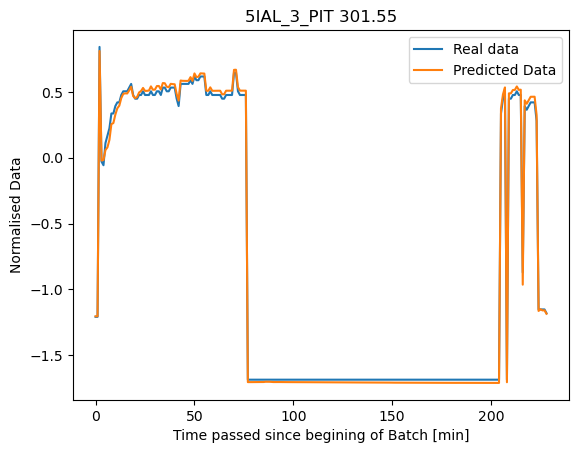

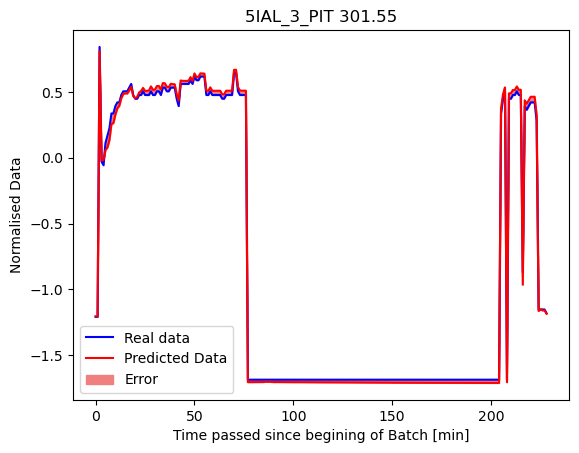

In [21]:
#Get random batch
Random_Batch=Train_Grouped.get_group(random.sample(Train_Batches,1)[0])
Random_Batch=Random_Batch.drop(['5IAL_3_301.BatchName'],axis=1)
Random_Batch=np.expand_dims(Random_Batch,axis=2)

# Fit the batch using the model
Random_Batch_Pred= model.predict(Random_Batch)

# Choose which channel to plot
var=2

# Plot without fill
plt.plot(Random_Batch[:,var,0])
plt.plot(Random_Batch_Pred[:,var,0])
plt.legend(['Real data','Predicted Data'])
plt.xlabel('Time passed since begining of Batch [min]')
plt.ylabel('Normalised Data')
plt.title(data_norm.columns[var])
plt.figure()

# Plot with fill
plt.plot(Random_Batch[:,var,0],'b')
plt.plot(Random_Batch_Pred[:,var,0],'r')
plt.fill_between(np.arange(Random_Batch.shape[0]), Random_Batch_Pred[:,var,0,0], Random_Batch[:,var,0], color='lightcoral')
plt.legend(labels=['Real data','Predicted Data', "Error"])
plt.xlabel('Time passed since begining of Batch [min]')
plt.ylabel('Normalised Data')
plt.title(data_norm.columns[var])

# Determine Mean Average Error (MAE)
MAE=np.sum(np.abs(Random_Batch[:,var,0]-Random_Batch_Pred[:,var,0,0])/Random_Batch.shape[0])
print(MAE)

## get random Test sample and display it here

3/3 [==============================] - 0s 3ms/step
0.06297624496794937


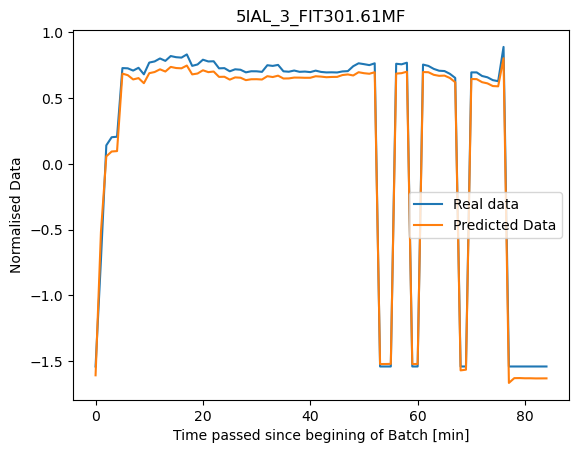

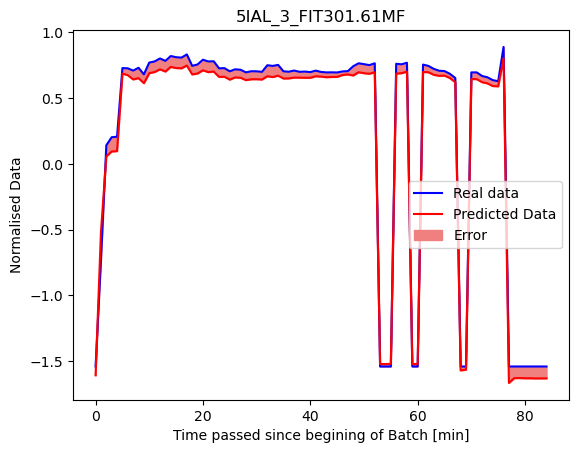

In [22]:
#Get random batch
Random_Batch=Test_Grouped.get_group(random.sample(Test_Batches,1)[0])
Random_Batch=Random_Batch.drop(['5IAL_3_301.BatchName'],axis=1)
Random_Batch=np.expand_dims(Random_Batch,axis=2)

# Fit the batch using the model
Random_Batch_Pred= model.predict(Random_Batch)

# Choose which channel to plot
var=5   # 2=PIT 55, 5= MF

# Plot without fill
plt.plot(Random_Batch[:,var,0])
plt.plot(Random_Batch_Pred[:,var,0])
plt.legend(['Real data','Predicted Data'])
plt.xlabel('Time passed since begining of Batch [min]')
plt.ylabel('Normalised Data')
plt.title(data_norm.columns[var])
plt.figure()

# Plot with fill
plt.plot(Random_Batch[:,var,0],'b')
plt.plot(Random_Batch_Pred[:,var,0],'r')
plt.fill_between(np.arange(Random_Batch.shape[0]), Random_Batch_Pred[:,var,0,0], Random_Batch[:,var,0], color='lightcoral')
plt.legend(labels=['Real data','Predicted Data', "Error"])
plt.xlabel('Time passed since begining of Batch [min]')
plt.ylabel('Normalised Data')
plt.title(data_norm.columns[var])

# Determine Mean Average Error (MAE)
MAE=np.sum(np.abs(Random_Batch[:,var,0]-Random_Batch_Pred[:,var,0,0])/Random_Batch.shape[0])
print(MAE)

## Plot not random batch
Use the first line here to plot a specefic batch from the Test set.

5/5 [==============================] - 0s 3ms/step
0.1637286846013392


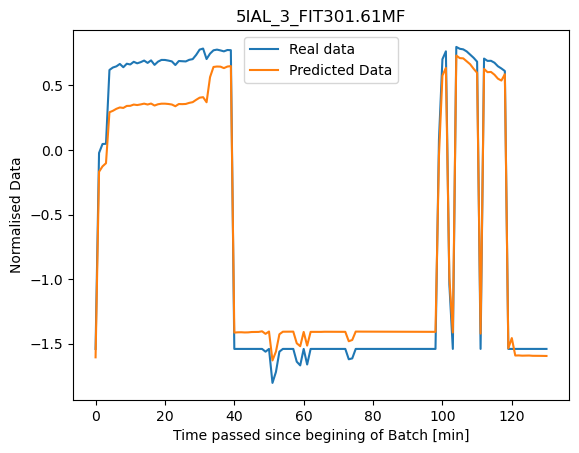

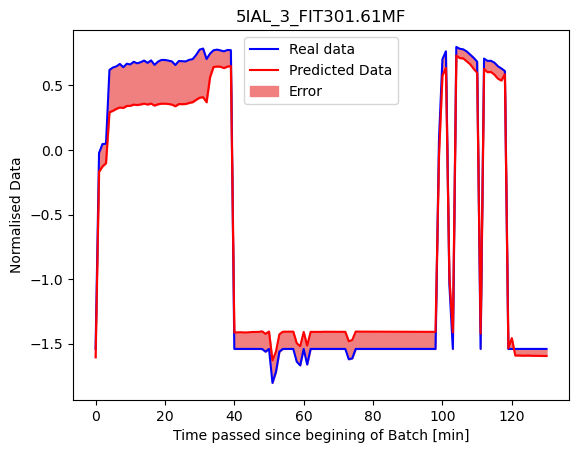

In [23]:
#Get random batch
Random_Batch=Test_Grouped.get_group(Test_Batches[48])
Random_Batch=Random_Batch.drop(['5IAL_3_301.BatchName'],axis=1)
Random_Batch=np.expand_dims(Random_Batch,axis=2)

# Fit the batch using the model
Random_Batch_Pred= model.predict(Random_Batch)

# Choose which channel to plot
var=5   # 2=PIT 55, 5= MF

# Plot without fill
plt.plot(Random_Batch[:,var,0])
plt.plot(Random_Batch_Pred[:,var,0])
plt.legend(['Real data','Predicted Data'])
plt.xlabel('Time passed since begining of Batch [min]')
plt.ylabel('Normalised Data')
plt.title(data_norm.columns[var])
plt.figure()

# Plot with fill
plt.plot(Random_Batch[:,var,0],'b')
plt.plot(Random_Batch_Pred[:,var,0],'r')
plt.fill_between(np.arange(Random_Batch.shape[0]), Random_Batch_Pred[:,var,0,0], Random_Batch[:,var,0], color='lightcoral')
plt.legend(labels=['Real data','Predicted Data', "Error"])
plt.xlabel('Time passed since begining of Batch [min]')
plt.ylabel('Normalised Data')
plt.title(data_norm.columns[var])

# Determine Mean Average Error (MAE)
MAE=np.sum(np.abs(Random_Batch[:,var,0]-Random_Batch_Pred[:,var,0,0])/Random_Batch.shape[0])
print(MAE)

## Show all Test batches of 1 particuar signal

0
1
2
3
4
5
6
7
8
9
10
11


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
Done fitting


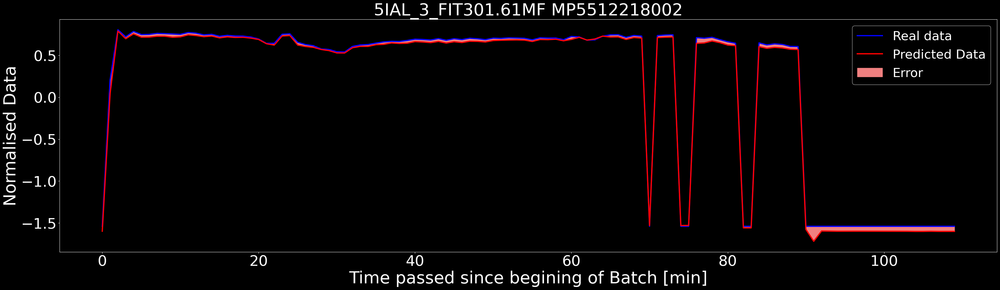

<Figure size 640x480 with 0 Axes>

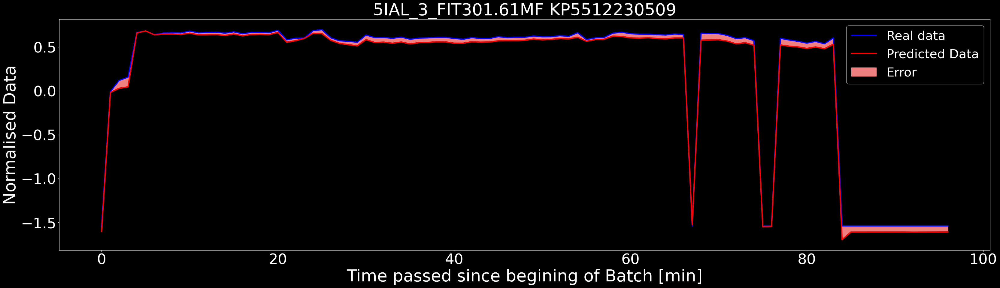

<Figure size 640x480 with 0 Axes>

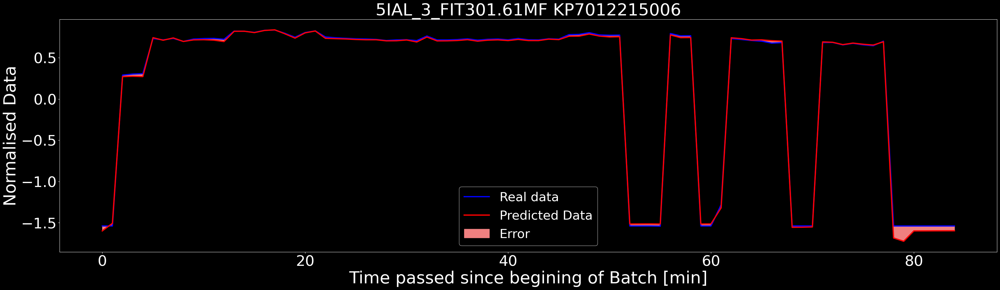

<Figure size 640x480 with 0 Axes>

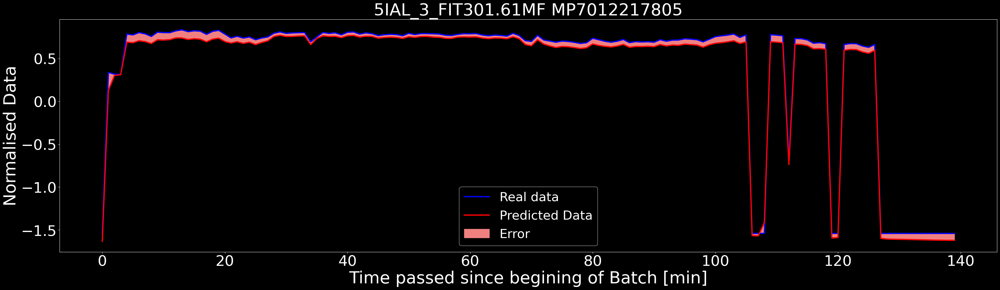

<Figure size 640x480 with 0 Axes>

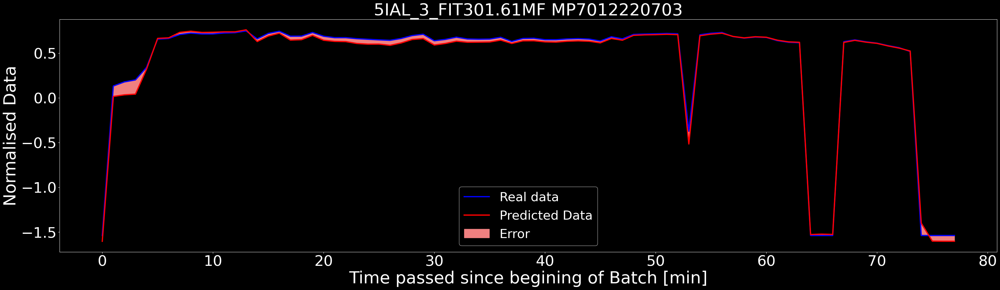

<Figure size 640x480 with 0 Axes>

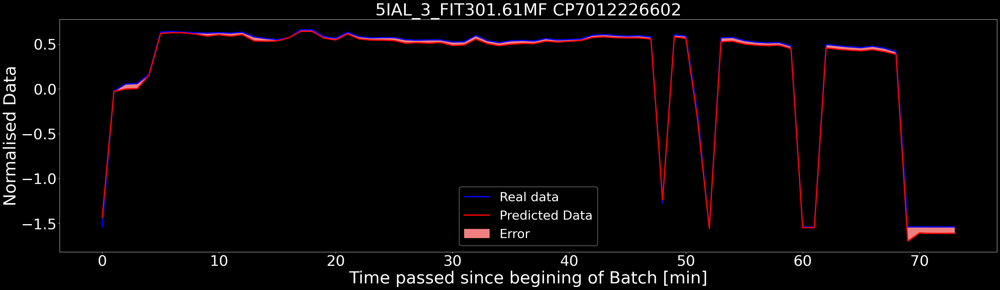

<Figure size 640x480 with 0 Axes>

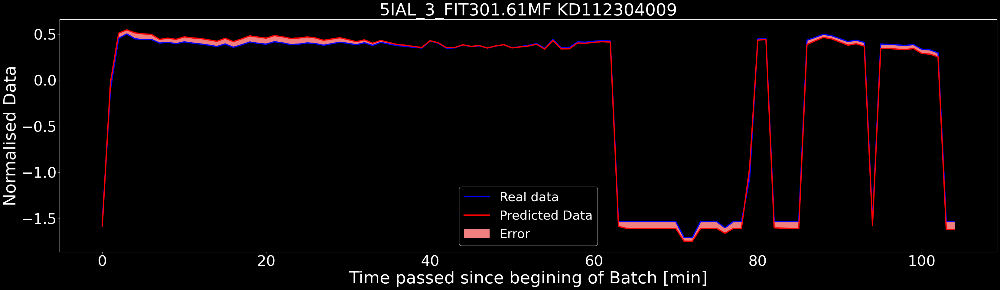

<Figure size 640x480 with 0 Axes>

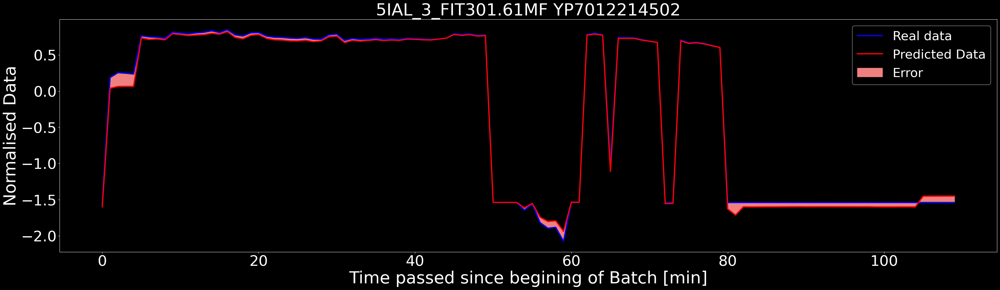

<Figure size 640x480 with 0 Axes>

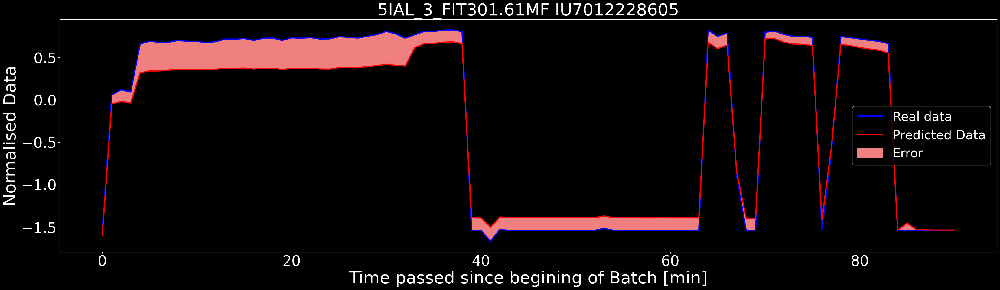

<Figure size 640x480 with 0 Axes>

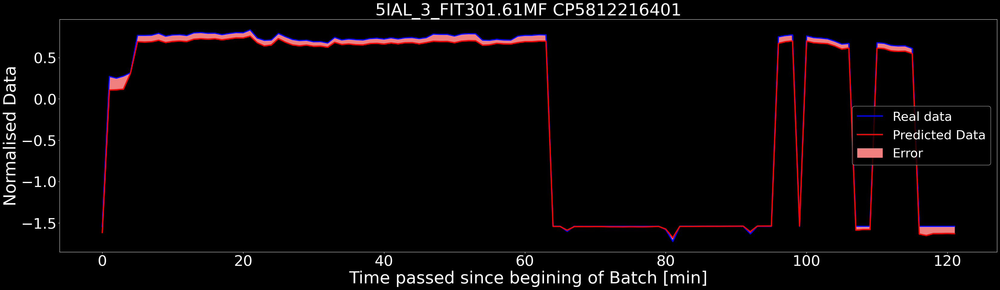

<Figure size 640x480 with 0 Axes>

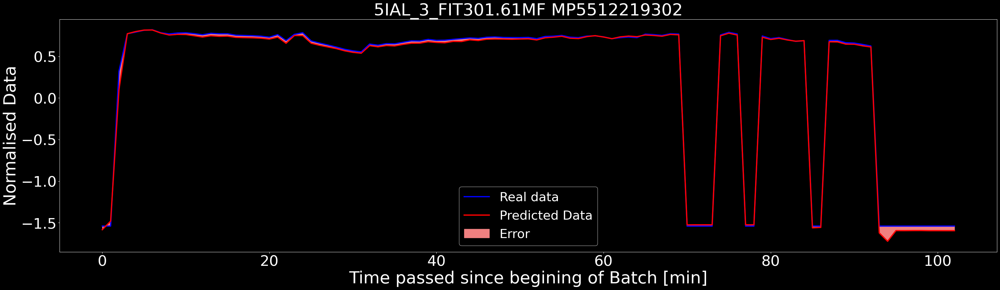

<Figure size 640x480 with 0 Axes>

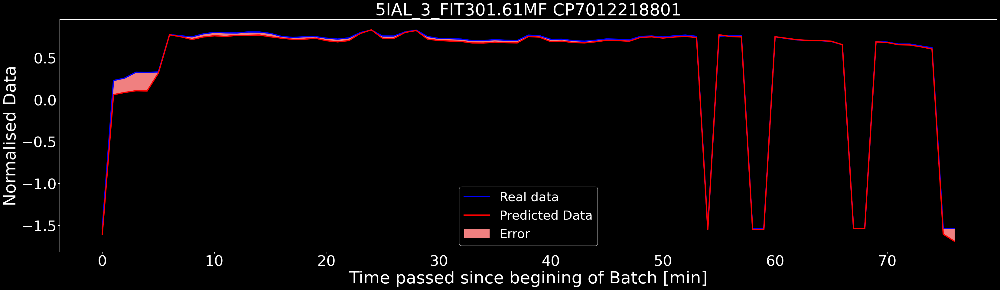

<Figure size 640x480 with 0 Axes>

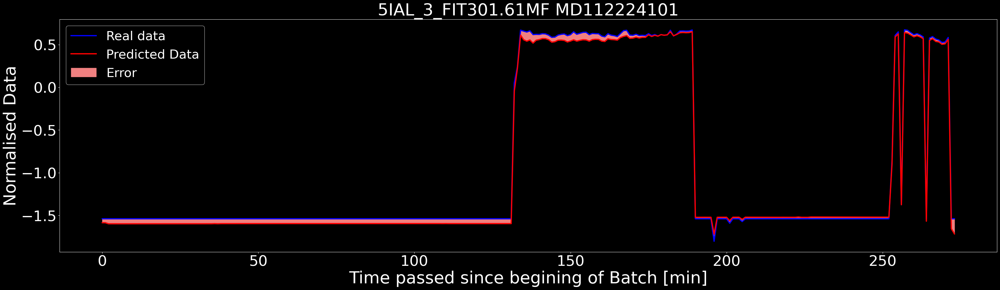

<Figure size 640x480 with 0 Axes>

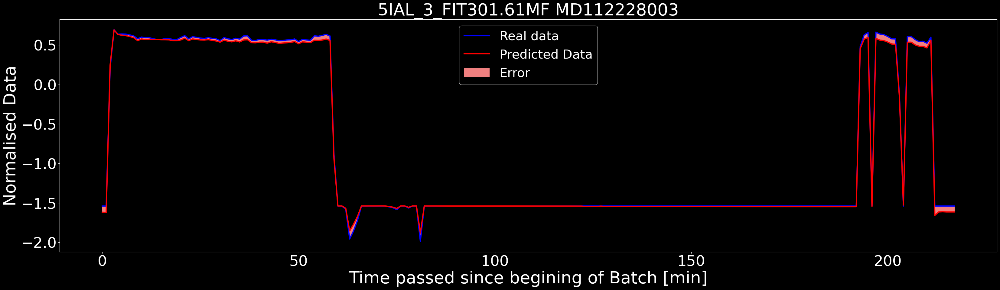

<Figure size 640x480 with 0 Axes>

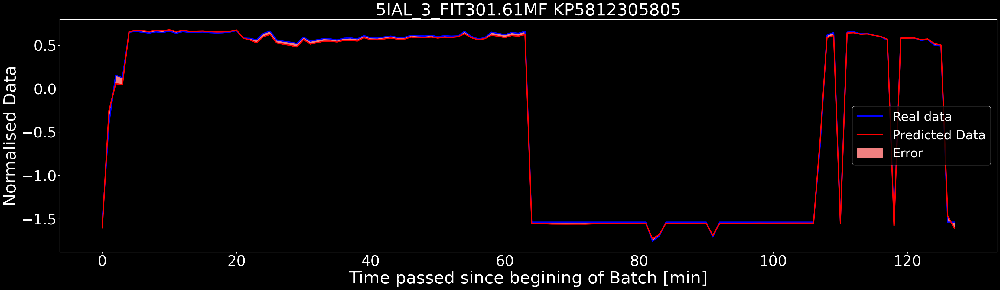

<Figure size 640x480 with 0 Axes>

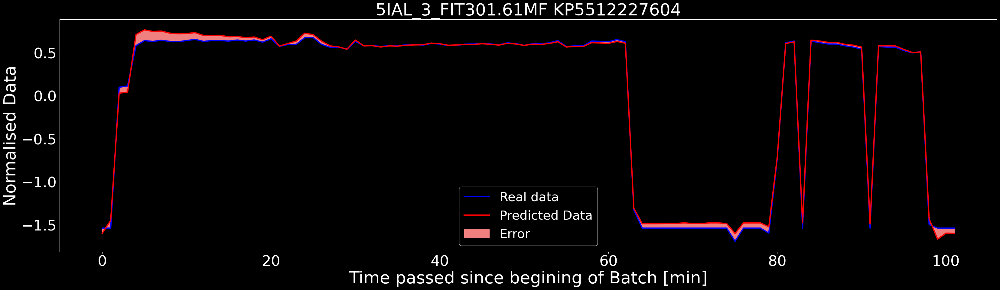

<Figure size 640x480 with 0 Axes>

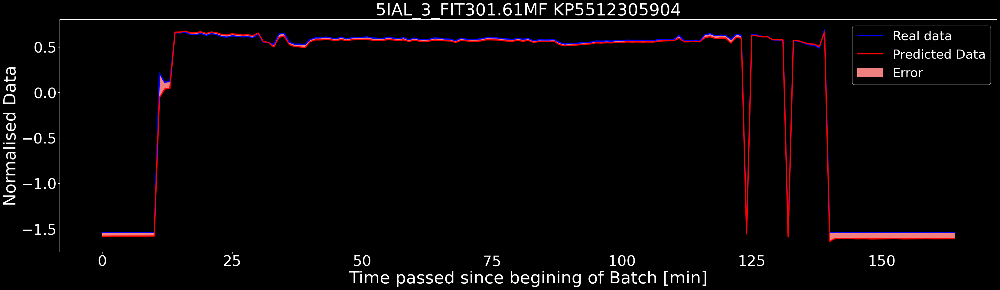

<Figure size 640x480 with 0 Axes>

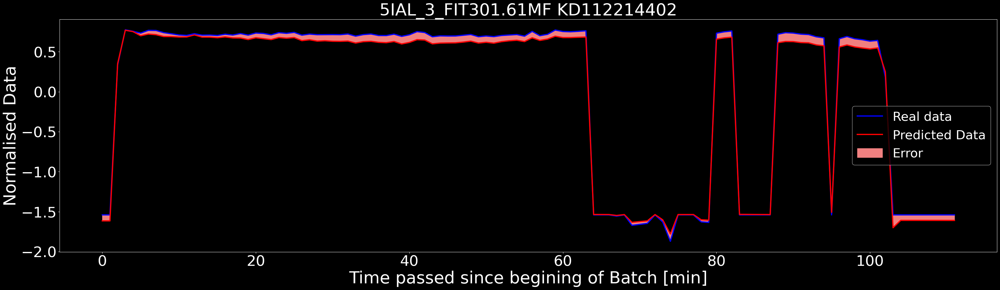

<Figure size 640x480 with 0 Axes>

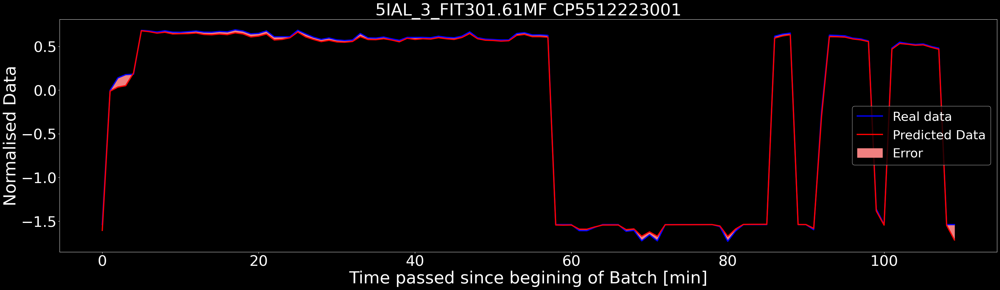

<Figure size 640x480 with 0 Axes>

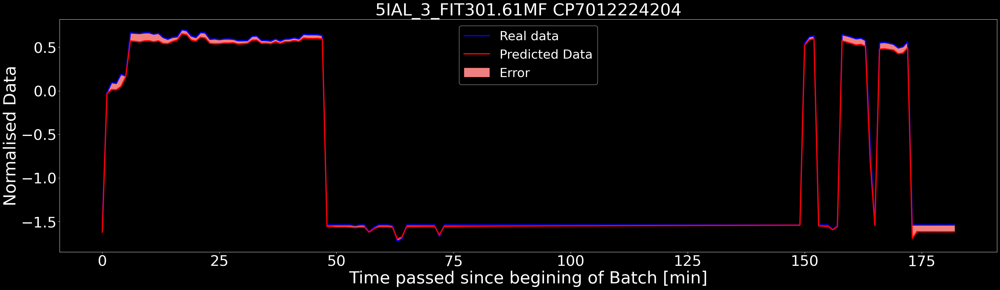

<Figure size 640x480 with 0 Axes>

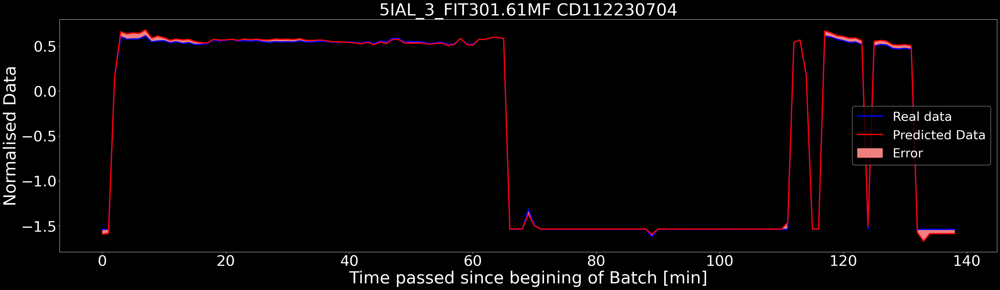

<Figure size 640x480 with 0 Axes>

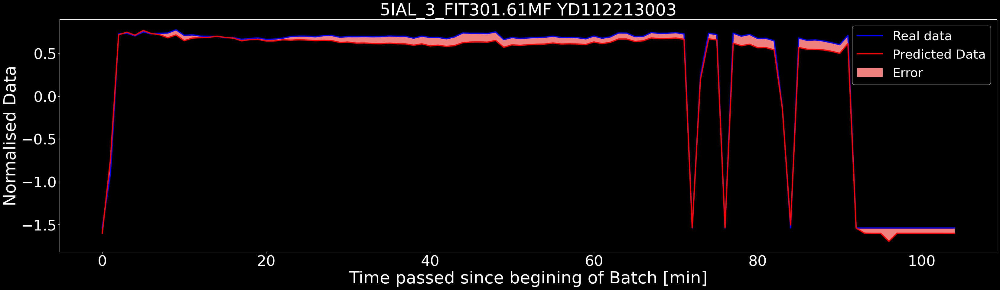

<Figure size 640x480 with 0 Axes>

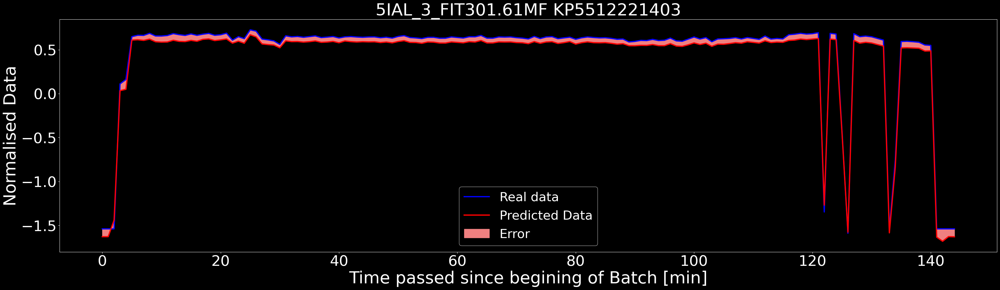

<Figure size 640x480 with 0 Axes>

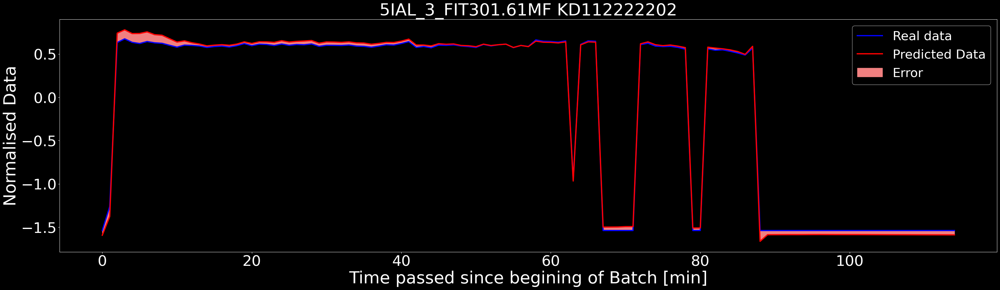

<Figure size 640x480 with 0 Axes>

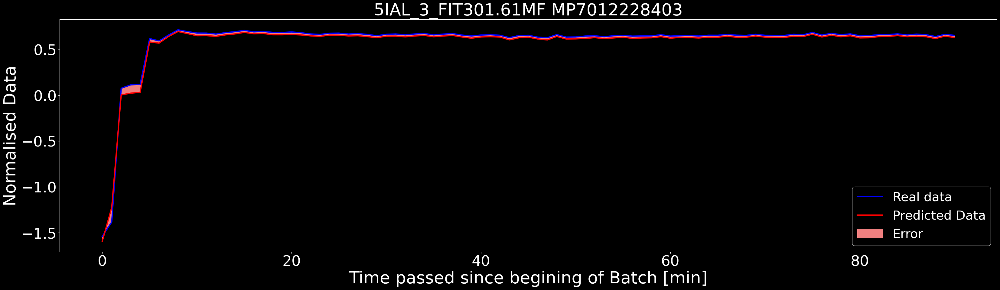

<Figure size 640x480 with 0 Axes>

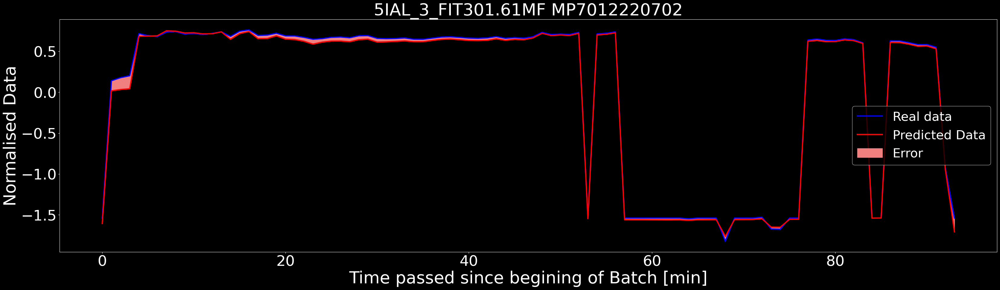

<Figure size 640x480 with 0 Axes>

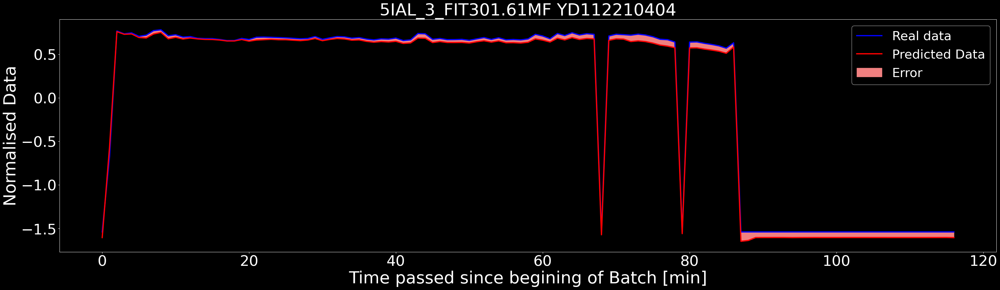

<Figure size 640x480 with 0 Axes>

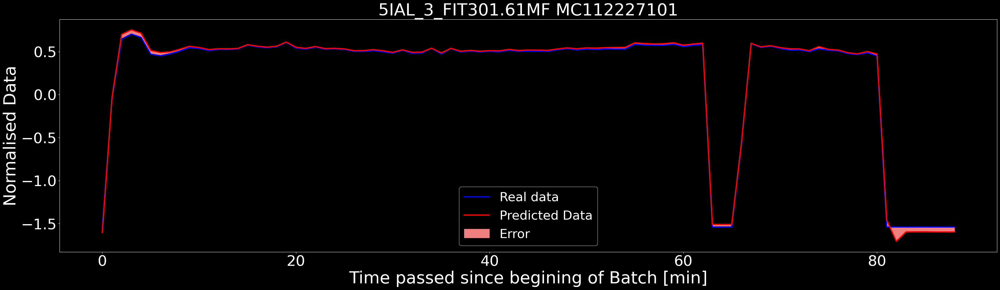

<Figure size 640x480 with 0 Axes>

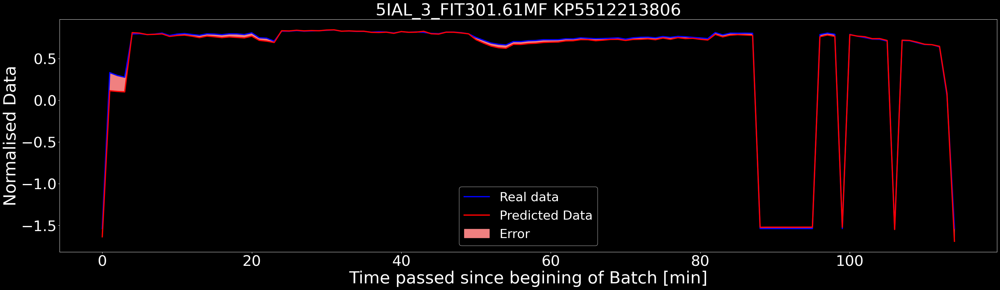

<Figure size 640x480 with 0 Axes>

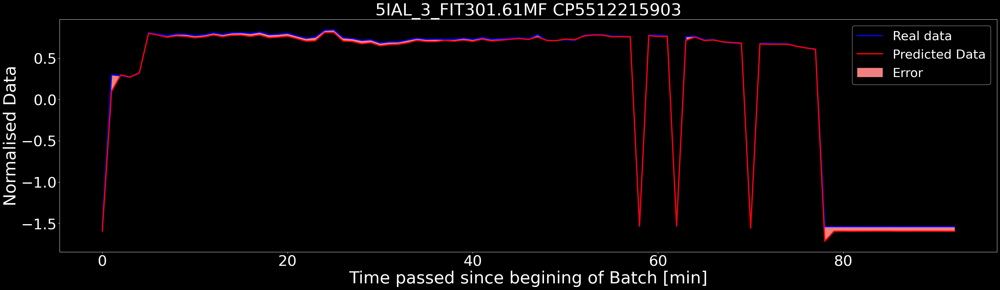

<Figure size 640x480 with 0 Axes>

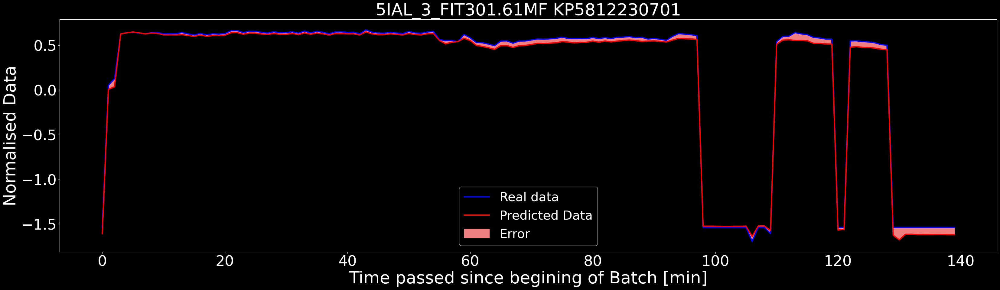

<Figure size 640x480 with 0 Axes>

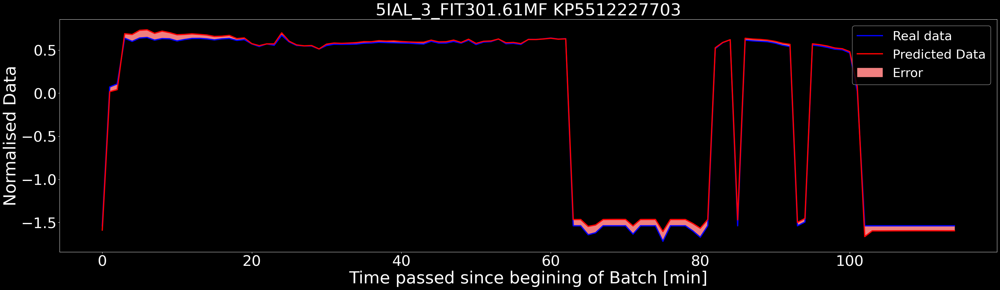

<Figure size 640x480 with 0 Axes>

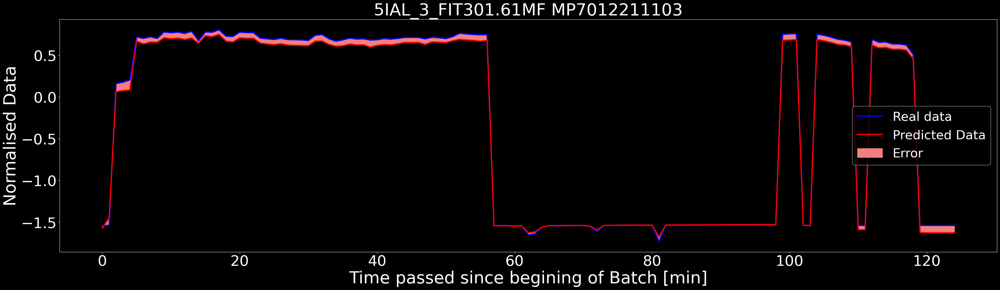

<Figure size 640x480 with 0 Axes>

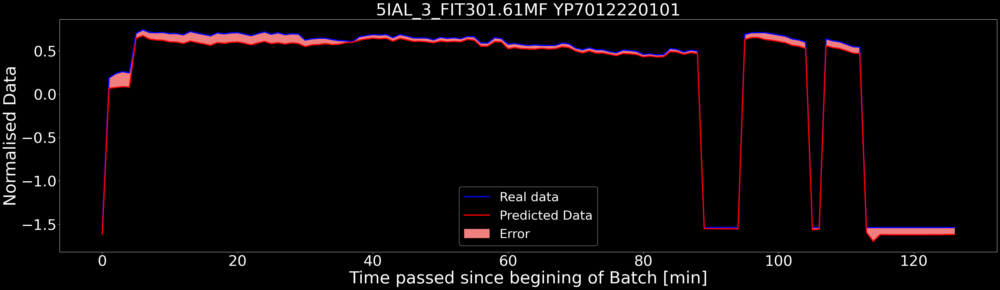

<Figure size 640x480 with 0 Axes>

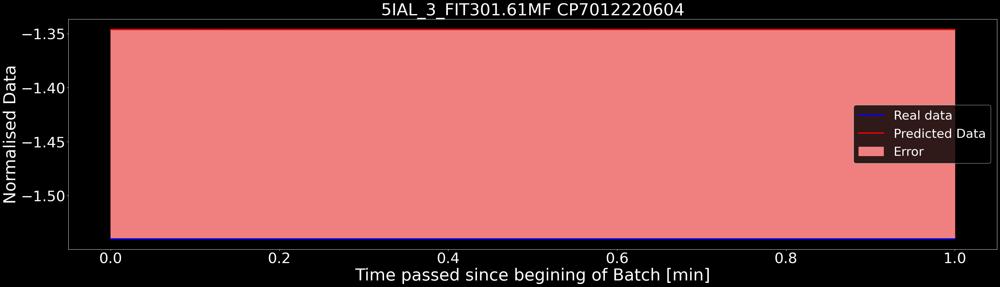

<Figure size 640x480 with 0 Axes>

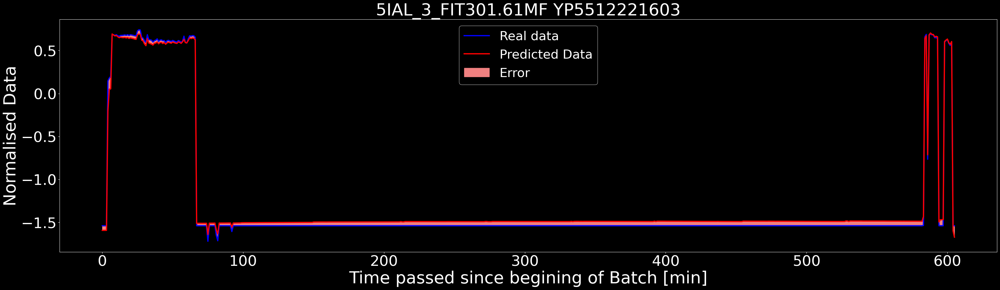

<Figure size 640x480 with 0 Axes>

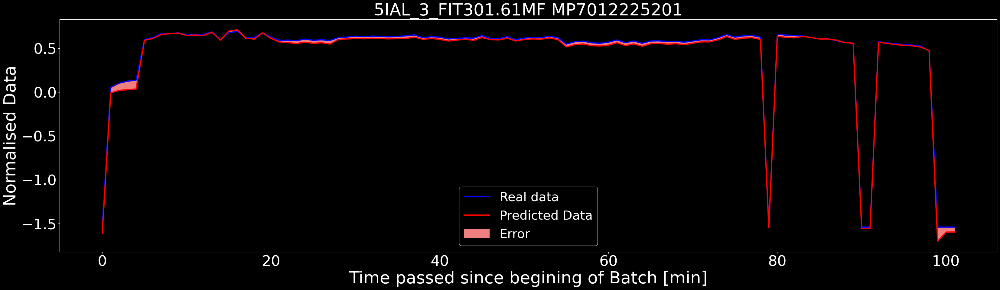

<Figure size 640x480 with 0 Axes>

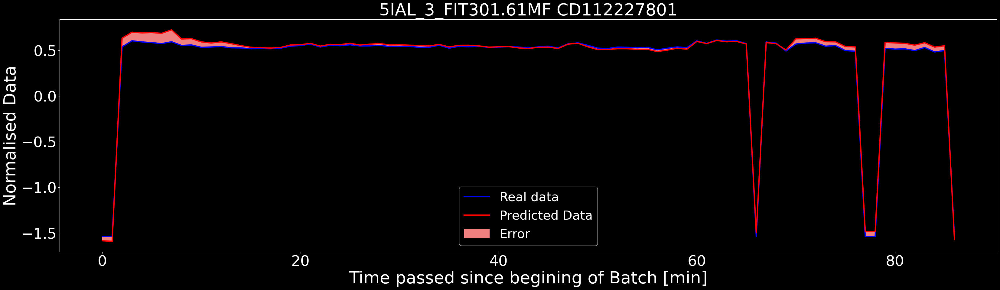

<Figure size 640x480 with 0 Axes>

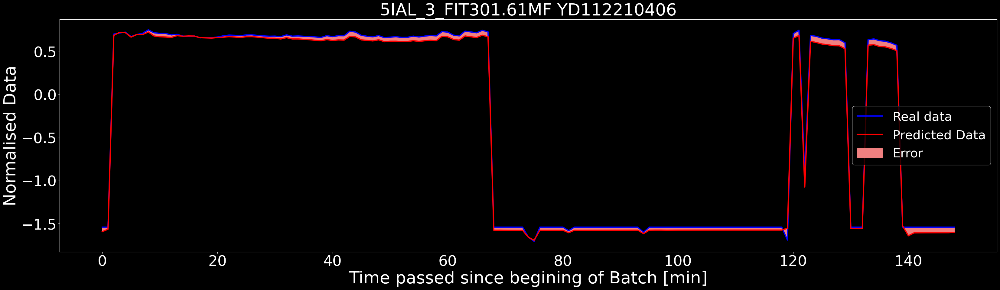

<Figure size 640x480 with 0 Axes>

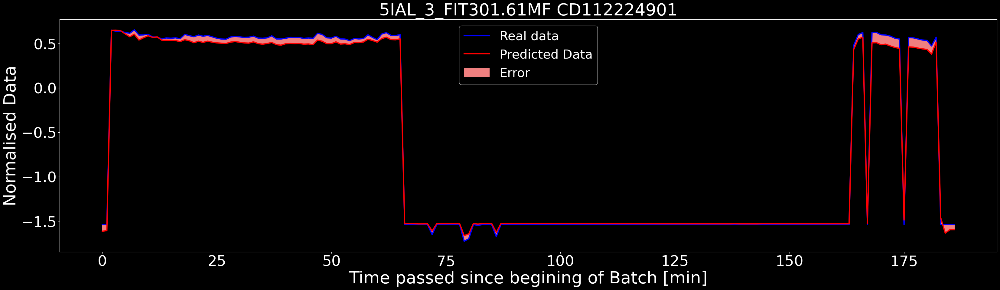

<Figure size 640x480 with 0 Axes>

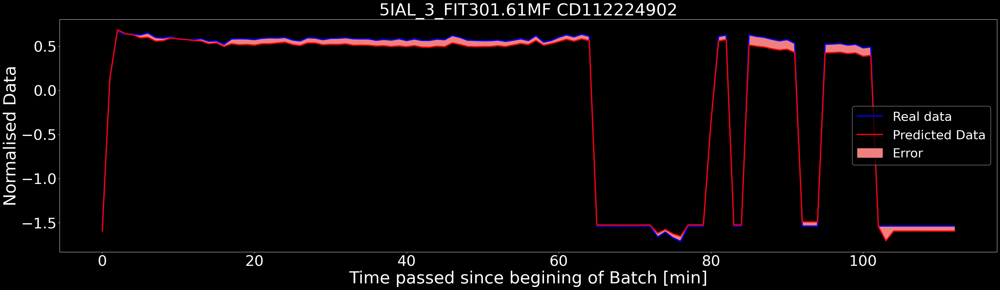

<Figure size 640x480 with 0 Axes>

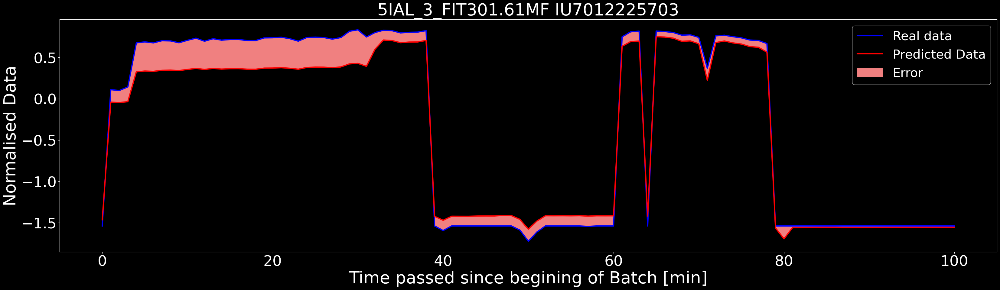

<Figure size 640x480 with 0 Axes>

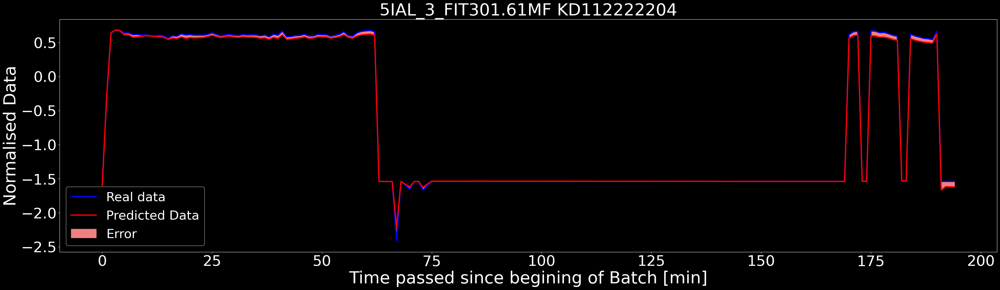

<Figure size 640x480 with 0 Axes>

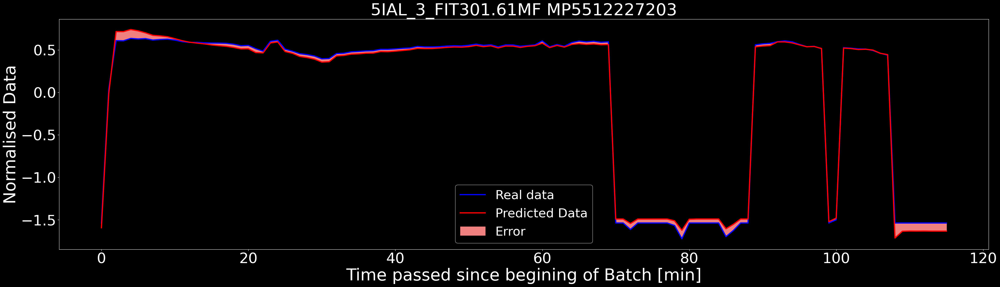

<Figure size 640x480 with 0 Axes>

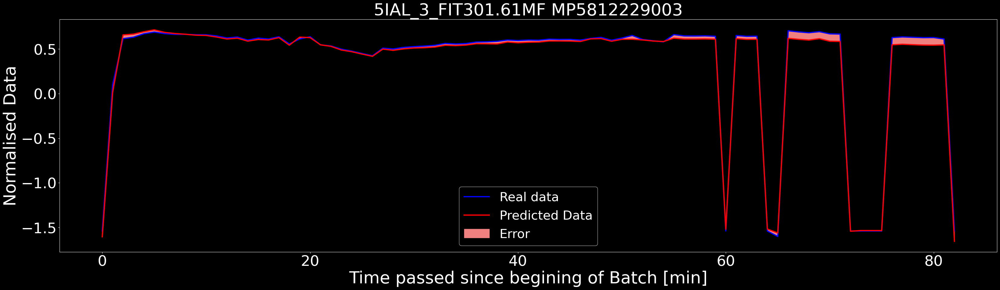

<Figure size 640x480 with 0 Axes>

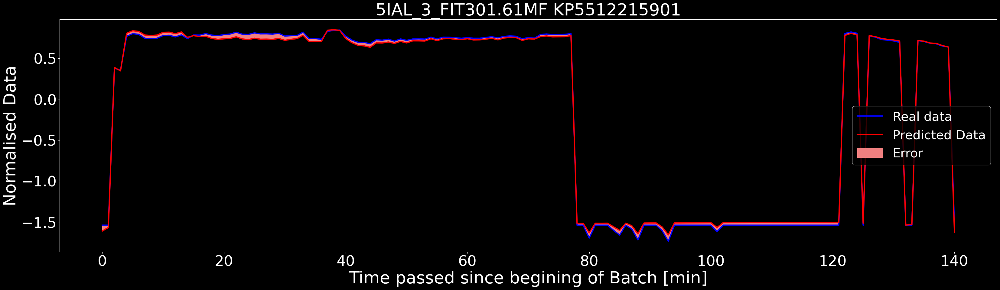

<Figure size 640x480 with 0 Axes>

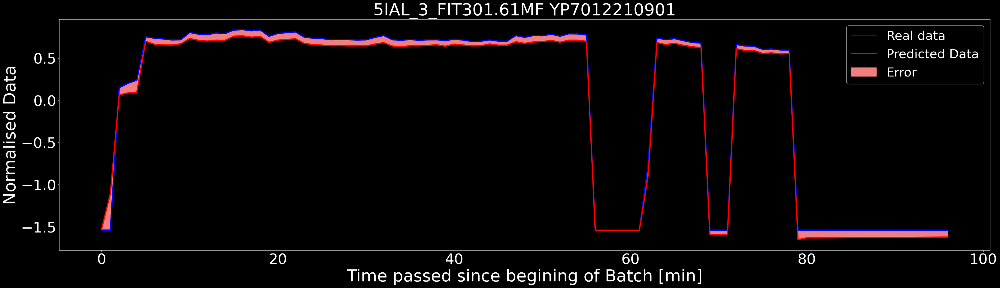

<Figure size 640x480 with 0 Axes>

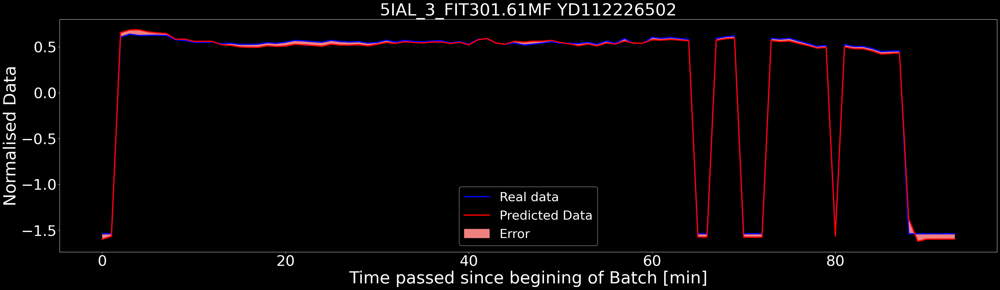

<Figure size 640x480 with 0 Axes>

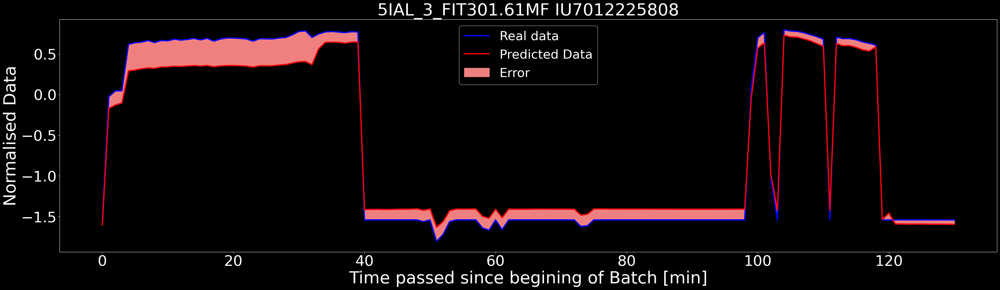

<Figure size 640x480 with 0 Axes>

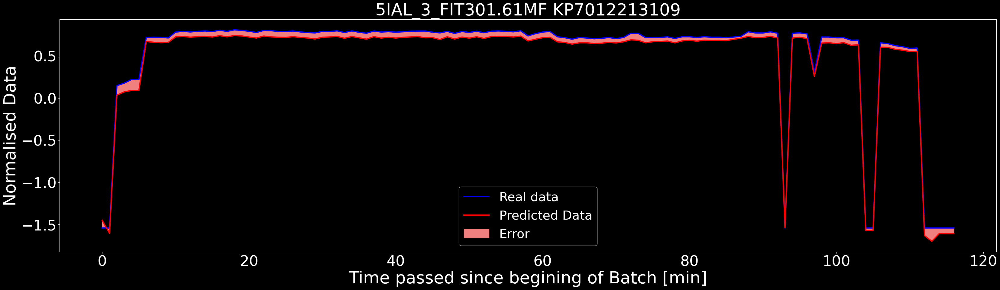

<Figure size 640x480 with 0 Axes>

In [24]:
#len(Test_Batches)
for i in range(50):
    print(i)
    
    # Get i-th test batch name
    batch_name_loop=Test_Batches[i]
    Random_Batch=Test_Grouped.get_group(batch_name_loop)
    Random_Batch=Random_Batch.drop(['5IAL_3_301.BatchName'],axis=1)
    Random_Batch=np.expand_dims(Random_Batch,axis=2)

    # Fit the batch on the trained model 
    Random_Batch_Pred= model.predict(Random_Batch,verbose=0)
    
    # Choose which channel to plot
    var=5  # 2=PIT 55, 5= MF
    
    # Plot the figure with filling
    plt.style.use('dark_background')
    fig, ax = plt.subplots(figsize=(40,10))
    
    ax.plot(Random_Batch[:,var,0],'b',linewidth=3)
    ax.plot(Random_Batch_Pred[:,var,0],'r',linewidth=3)
    ax.fill_between(np.arange(Random_Batch.shape[0]), Random_Batch_Pred[:,var,0,0], Random_Batch[:,var,0], color='lightcoral')
    ax.legend(labels=['Real data','Predicted Data', "Error"],fontsize=30)
    ax.set_xlabel('Time passed since begining of Batch [min]',)
    ax.set_ylabel('Normalised Data')
    ax.set_title(data_norm.columns[var] + ' ' + batch_name_loop) 
    ax.tick_params(axis='both', labelsize=35)
    ax.yaxis.label.set_size(40)
    ax.xaxis.label.set_size(40)
    ax.title.set_fontsize(40)
    plt.figure()

print('Done fitting')

## Calculate the MAE of the entire test set without plotting
5IAL_3_TT301.50', '5IAL_3_QIT301.52', '5IAL_3_PIT 301.55', \
       '5IAL_3_QIT301.57', '5IAL_3_PIT301.60', '5IAL_3_FIT301.61MF',\
       '5IAL_3_FIT301.61VF', '5IAL_3_FIT301.61D', '5IAL_3_PIT301.63',\
       '5IAL_3_P301.70', '5IAL_3_R301.71', '5IAL_3_P301.72',\
       '5IAL_3_XPV301.53', '5IAL_3_XPV301.54', '5IAL_3_XPV301.63',\
       '5IAL_3_LSL301.51', '5IAL_3_LSL301.53', '5IAL_3_GSC301.44',\
       '5IAL_3_GSO301.44', '5IAL_3_LSL301.68', '5IAL_3_LSLL301.69',\
       '5IAL_3_301.OCCUPIED', '5IAL_3_LIT301.54', '5IAL_3_XPV301.13',\
       '5IAL_3_WY301.54', '5IAL_3_301.BatchName')\

Done fitting
0.05236342502904571


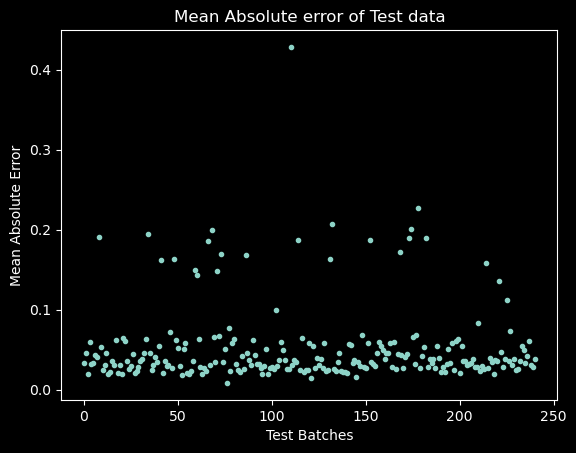

In [25]:
# Initalise empy lists
MAE_arrea=[]
string_arra=[]

#len(Test_Batches)
for i in range(len(Test_Batches)):
    
    # Get i-th test batch name
    batch_name_loop=Test_Batches[i]
    Random_Batch=Test_Grouped.get_group(batch_name_loop)
    Random_Batch=Random_Batch.drop(['5IAL_3_301.BatchName'],axis=1)
    Random_Batch=np.expand_dims(Random_Batch,axis=2)

    # Fit the batch on the trained model 
    Random_Batch_Pred= model.predict(Random_Batch,verbose=0)
    
    # Choose which channel to plot
    var=5  # 2=PIT 55, 5= MF
    
    # Calculate Mean Average Error of the Autoencoder, append the value to the list
    MAE=np.sum(np.abs(Random_Batch[:,var,0]-Random_Batch_Pred[:,var,0,0])/Random_Batch.shape[0])
    MAE_arrea.append(MAE)
    string_arra.append(batch_name_loop)

    
print('Done fitting')

plt.plot(MAE_arrea,'.')
plt.ylabel('Mean Absolute Error')
plt.xlabel('Test Batches')
plt.title('Mean Absolute error of Test data')
print(np.mean(MAE_arrea))

index(['5IAL_3_TT301.50', '5IAL_3_QIT301.52', '5IAL_3_PIT 301.55',\
       '5IAL_3_QIT301.57', '5IAL_3_PIT301.60', '5IAL_3_FIT301.61MF',\
       '5IAL_3_FIT301.61VF', '5IAL_3_FIT301.61D', '5IAL_3_PIT301.63',\
       '5IAL_3_P301.70', '5IAL_3_R301.71', '5IAL_3_P301.72',\
       '5IAL_3_XPV301.53', '5IAL_3_XPV301.54', '5IAL_3_XPV301.63',\
       '5IAL_3_LSL301.51', '5IAL_3_LSL301.53', '5IAL_3_GSC301.44',\
       '5IAL_3_GSO301.44', '5IAL_3_LSL301.68', '5IAL_3_LSLL301.69',\
       '5IAL_3_301.OCCUPIED', '5IAL_3_LIT301.54', '5IAL_3_XPV301.13',\
       '5IAL_3_WY301.54', '5IAL_3_301.BatchName'],\
      dtype='object')

## Plot the MAE of a batch based on the date of that batch

In [26]:
Batch_and_Date=pd.DataFrame()
for row in Test_Batches:
    
    pd_data=(data['5IAL_3_301.BatchName']==row)
    batch_date=(data['Date'][pd_data[pd_data].index[0]])

    
    Random_Batch=Test_Grouped.get_group(row)
    Random_Batch=Random_Batch.drop(['5IAL_3_301.BatchName'],axis=1)
    Random_Batch=np.expand_dims(Random_Batch,axis=2)
    
    Random_Batch_Pred= model.predict(Random_Batch, verbose=0)
    
    # 2=PIT 55, 5= MF
        
    MAE=np.sum(np.abs(Random_Batch[:,var,0]-Random_Batch_Pred[:,var,0,0])/Random_Batch.shape[0])
    
    Batch_and_Date[row]=[batch_date,MAE]

Batch_and_Date=Batch_and_Date.transpose()
Batch_and_Date.rename(columns={0: 'Date',1: 'MAE'},inplace=True)
Batch_and_Date.sort_values(by=['Date'],inplace=True)

print(Batch_and_Date)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:18: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`


                            Date       MAE
YP5812210102 2022-04-11 09:20:00  0.028707
KD112210201  2022-04-12 06:29:00  0.028288
YD112210401  2022-04-14 00:10:00  0.038383
YD112210402  2022-04-14 01:48:00  0.038268
YD112210404  2022-04-14 06:02:00  0.044956
...                          ...       ...
KP5512305904 2023-02-28 15:24:00  0.030831
KP5512305907 2023-02-28 23:25:00  0.018587
MP5512306001 2023-03-01 22:15:00  0.019073
YP5512306101 2023-03-02 06:34:00  0.020826
KB212306202  2023-03-03 17:18:00  0.008284

[241 rows x 2 columns]


0.052363425646888555


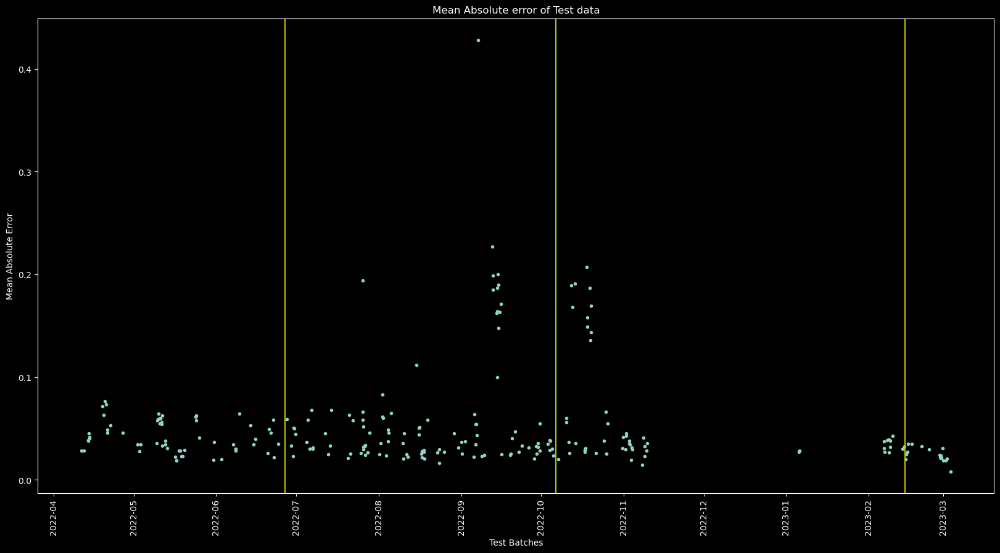

In [27]:
plt.figure(figsize=(20,10))
plt.plot(Batch_and_Date['Date'],Batch_and_Date['MAE'],'.')
plt.ylabel('Mean Absolute Error')
plt.xlabel('Test Batches')
plt.title('Mean Absolute error of Test data')
plt.tick_params(axis='x', labelrotation=90)

plt.axvline(datetime.datetime(2022,6,26,19,20),color='y')
plt.axvline(datetime.datetime(2022,10,6,11,23),color='y')
plt.axvline(datetime.datetime(2023,2,14,12,51),color='y')

print(np.mean(Batch_and_Date['MAE']))

0.052363425646888555


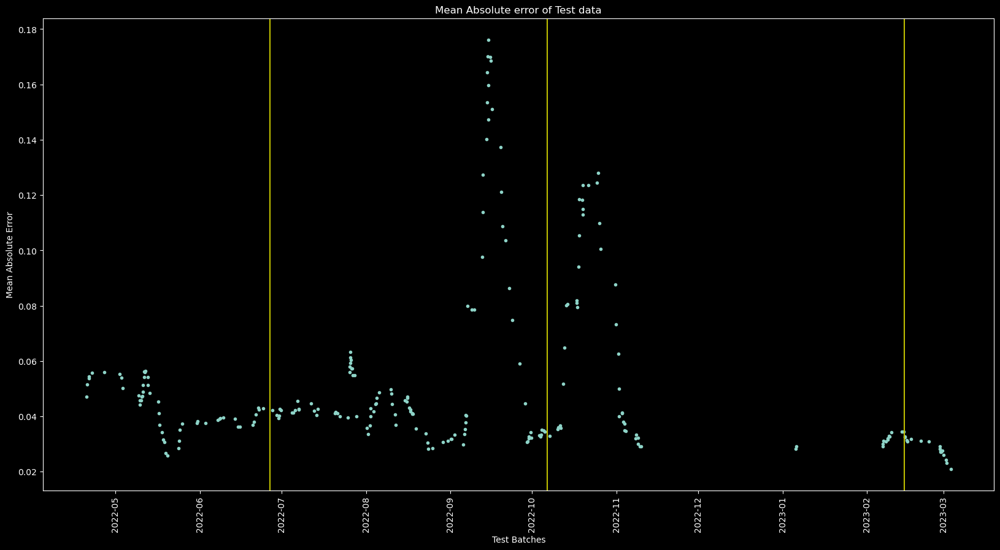

In [28]:
plt.figure(figsize=(20,10))
plt.plot(Batch_and_Date['Date'],Batch_and_Date['MAE'].rolling(10).mean(),'.')
plt.ylabel('Mean Absolute Error')
plt.xlabel('Test Batches')
plt.title('Mean Absolute error of Test data')
plt.tick_params(axis='x', labelrotation=90)

plt.axvline(datetime.datetime(2022,6,26,19,20),color='y')
plt.axvline(datetime.datetime(2022,10,6,11,23),color='y')
plt.axvline(datetime.datetime(2023,2,14,12,51),color='y')

print(np.mean(Batch_and_Date['MAE']))

## Maak predictie van alle data, dus test+Train

In [29]:
Batch_and_Date=pd.DataFrame()

for row in Viable_Batches:
    
    pd_data=(data['5IAL_3_301.BatchName']==row)
    batch_date=(data['Date'][pd_data[pd_data].index[0]])

    
    Random_Batch=All_Grouped.get_group(row)
    Random_Batch=Random_Batch.drop(['5IAL_3_301.BatchName'],axis=1)
    Random_Batch=np.expand_dims(Random_Batch,axis=2)
    
    Random_Batch_Pred=model.predict(Random_Batch, verbose=0)

    MAE=np.sum(np.abs(Random_Batch[:,var,0]-Random_Batch_Pred[:,var,0,0])/Random_Batch.shape[0])
    
    Batch_and_Date[row]=[batch_date,MAE]

Batch_and_Date=Batch_and_Date.transpose()
Batch_and_Date.rename(columns={0: 'Date',1: 'MAE'},inplace=True)
Batch_and_Date.sort_values(by=['Date'],inplace=True)

print(Batch_and_Date)



/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  app.launch_new_instance()


                            Date       MAE
YP5812210101 2022-04-11 07:29:00  0.034461
YP5812210102 2022-04-11 09:20:00  0.028707
CD112210101  2022-04-11 18:41:00  0.033399
CD112210102  2022-04-11 22:22:00  0.029696
CD112210103  2022-04-12 00:06:00   0.03128
...                          ...       ...
CB212306201  2023-03-03 08:23:00  0.021754
KB212306201  2023-03-03 14:56:00  0.018739
KB212306202  2023-03-03 17:18:00  0.008284
KB212306501  2023-03-06 07:36:00  0.025736
KC112306501  2023-03-06 11:32:00  0.023081

[1205 rows x 2 columns]


0.04721123698948617


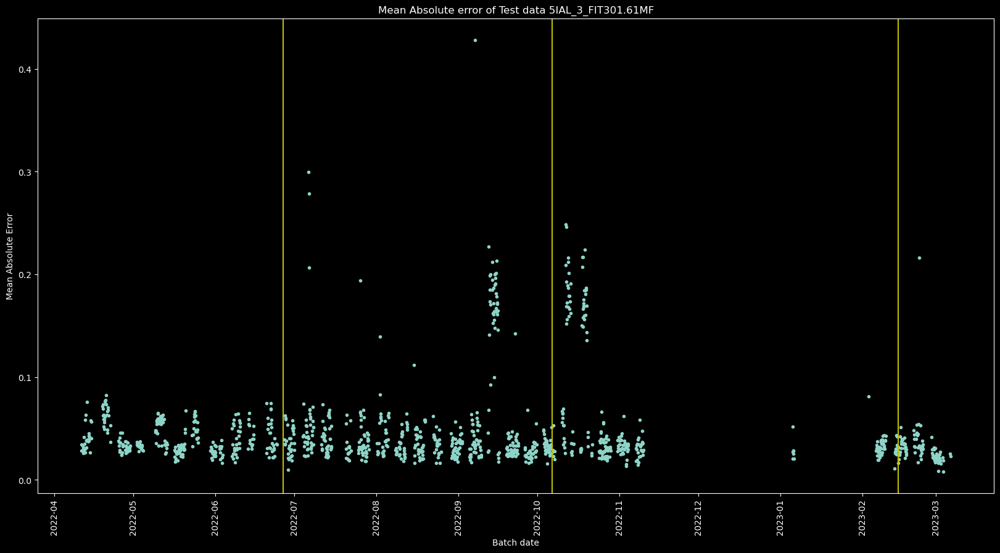

In [30]:
plt.figure(figsize=(20,10))
plt.plot(Batch_and_Date['Date'],Batch_and_Date['MAE'],'.')
plt.ylabel('Mean Absolute Error')
plt.xlabel('Batch date')
plt.title('Mean Absolute error of Test data ' + data_norm.columns[var])
plt.tick_params(axis='x', labelrotation=90)

plt.axvline(datetime.datetime(2022,6,26,19,20),color='y')
plt.axvline(datetime.datetime(2022,10,6,11,23),color='y')
plt.axvline(datetime.datetime(2023,2,14,12,51),color='y')

print(np.mean(Batch_and_Date['MAE']))

0.04721123698948617


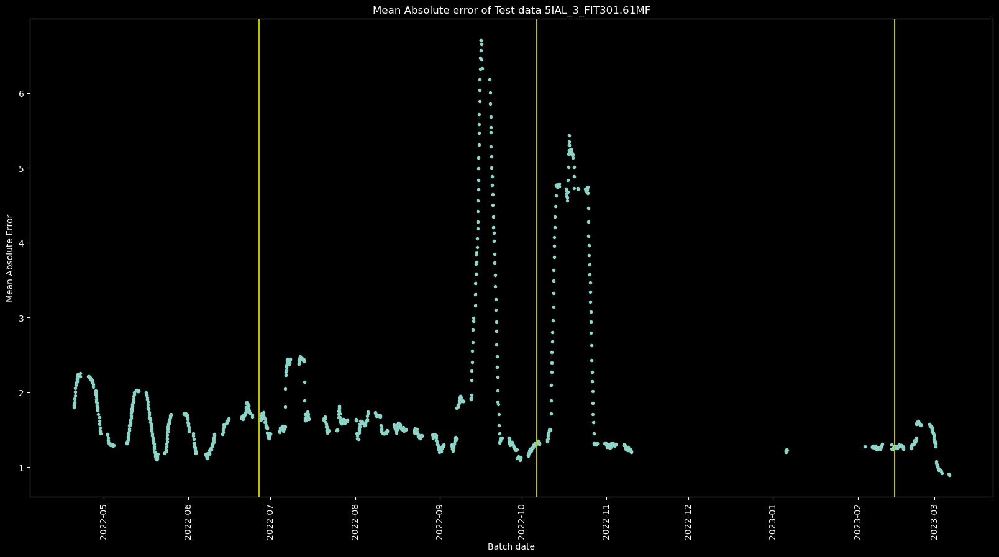

<Figure size 640x480 with 0 Axes>

In [31]:
Batch_and_Date['MAE_adj']=Batch_and_Date['MAE'] * (Batch_and_Date['MAE'] < 0.1)

plt.figure(figsize=(20,10))
plt.plot(Batch_and_Date['Date'],(Batch_and_Date['MAE'].rolling(40).sum()),'.')
plt.ylabel('Mean Absolute Error')
plt.xlabel('Batch date')
plt.title('Mean Absolute error of Test data '+ data_norm.columns[var])
plt.tick_params(axis='x', labelrotation=90)

plt.axvline(datetime.datetime(2022,6,26,19,20),color='y')
plt.axvline(datetime.datetime(2022,10,6,11,23),color='y')
plt.axvline(datetime.datetime(2023,2,14,12,51),color='y')
plt.figure()

print(np.mean(Batch_and_Date['MAE']))

0.0443368143080463


<Figure size 640x480 with 0 Axes>

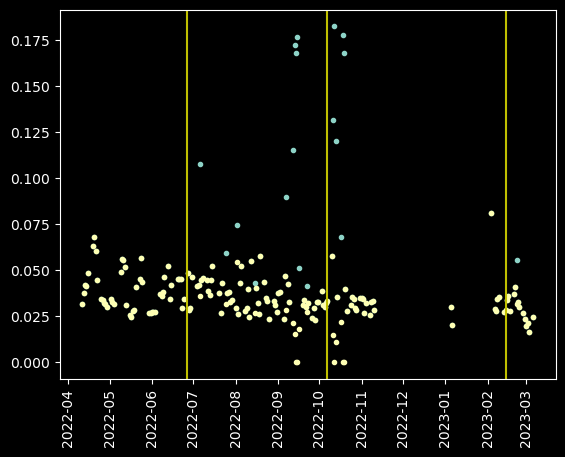

<Figure size 640x480 with 0 Axes>

In [32]:
week_frame=Batch_and_Date.set_index('Date')

weekly_mean = week_frame.resample('D').mean()

print(weekly_mean['MAE'].mean())

plt.plot(weekly_mean,'.')
plt.tick_params(axis='x', labelrotation=90)

plt.axvline(datetime.datetime(2022,6,26,19,20),color='y')
plt.axvline(datetime.datetime(2022,10,6,11,23),color='y')
plt.axvline(datetime.datetime(2023,2,14,12,51),color='y')
plt.figure()
